In [27]:
import geopandas as gpd
import pandas as pd
import contextily as ctx
import pathlib
import numpy as np
import networkx
from matplotlib import pyplot as plt
from shapely.geometry import Point, Polygon, LineString
import shapely

# Storm Forecasts & Track
Storm forecasts and historical track will be published for each in-game day.

The forecasts represent model predictions for where the hurricane might be at the given timestamp.

The storm track represents the true path that the storm took in the past.

In [29]:
# Forecasts
day1_forecast = gpd.read_file('https://files.bwsi-remote-sensing.net/data/final/day1/day1_forecasts_2023.geojson')

In [31]:
random_color = lambda: np.random.random(3)

In [33]:
# look at the forecasts
day1_forecast

,prediction,forecastHour,datetime,maxWinds,category,geometry
0,1,12,2023-08-02 08:00:00,70,1,POINT (-69.75497 37.90491)
1,1,24,2023-08-02 20:00:00,75,1,POINT (-70.50738 38.86856)
2,1,36,2023-08-03 08:00:00,85,2,POINT (-71.35866 39.41313)
3,1,48,2023-08-03 20:00:00,85,2,POINT (-71.72152 40.51758)
4,1,60,2023-08-04 08:00:00,100,3,POINT (-71.48969 41.18486)
...,...,...,...,...,...,...
155,20,48,2023-08-03 20:00:00,85,2,POINT (-71.49297 40.27587)
156,20,60,2023-08-04 08:00:00,100,3,POINT (-70.95934 42.12895)
157,20,72,2023-08-04 20:00:00,105,3,POINT (-71.61717 40.70945)
158,20,96,2023-08-05 20:00:00,90,2,POINT (-70.44554 43.65152)


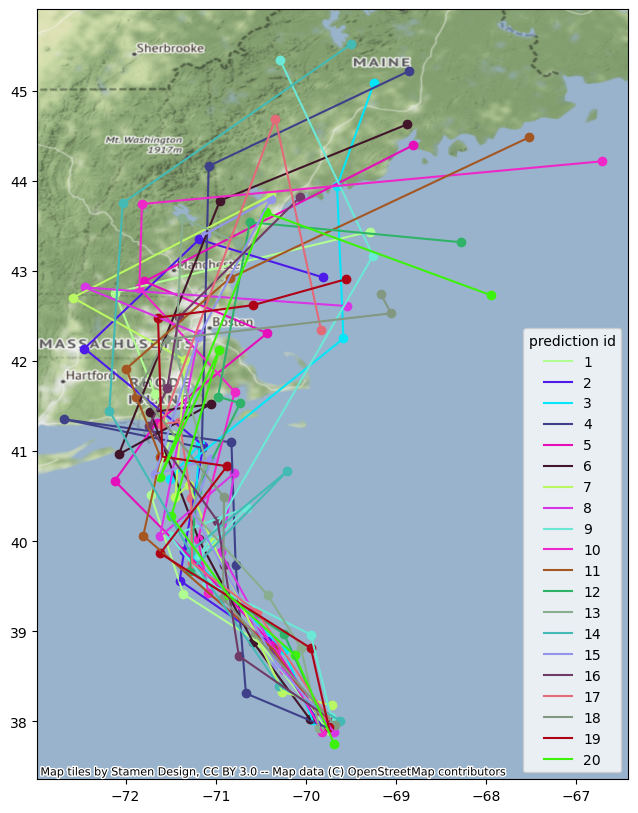

In [35]:
# each forecast report has a number of possible hurricane routes
# they are identified by the prediction column
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for pred_id, pred in day1_forecast.groupby('prediction'):
    c = random_color()
    pred.plot(color=c, ax=ax)
    line_to_plot = LineString(pred.geometry.values)
    ax.plot(line_to_plot.xy[0], line_to_plot.xy[1], color=c, label=f'{pred_id}')
ax.legend(title='prediction id')
ctx.add_basemap(ax, crs = day1_forecast.crs)

<Axes: >

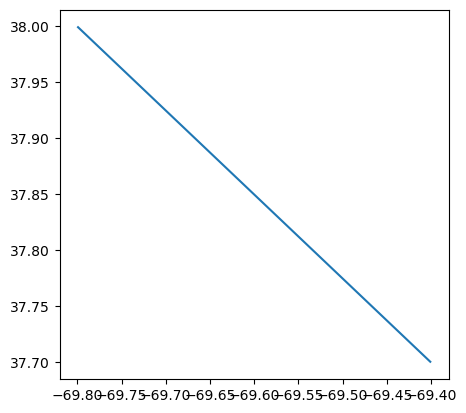

In [37]:
# track shows where the storm actually went in the past
day1_track = gpd.read_file('https://files.bwsi-remote-sensing.net/data/final/day1/day1_track_past.geojson')
day1_track.plot()

# Location of Areas of Interest


In [ ]:
!wget https://files.bwsi-remote-sensing.net/data/final/Hospitals_2023.geojson
!wget https://files.bwsi-remote-sensing.net/data/final/Shelters_2023.geojson

In [39]:
hospitals_gdf = gpd.read_file('Hospitals_2023.geojson')
shelters_gdf = gpd.read_file('Shelters_2023.geojson')

In [41]:
hospitals_gdf

,OBJECTID,ID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,TELEPHONE,TYPE,...,WEBSITE,STATE_ID,ALT_NAME,ST_FIPS,OWNER,TTL_STAFF,BEDS,TRAUMA,HELIPAD,geometry
0,49,0013402908,VA MEDICAL CENTER - PROVIDENCE,830 CHALKSTONE AVE,PROVIDENCE,RI,02908,NOT AVAILABLE,NOT AVAILABLE,GENERAL ACUTE CARE,...,http://www.providence.va.gov/,NOT AVAILABLE,NOT AVAILABLE,44,GOVERNMENT - FEDERAL,-999,-999.0,NOT AVAILABLE,N,POINT (-71.43315 41.83214)
1,98,0000502891,WESTERLY HOSPITAL,25 WELLS ST,WESTERLY,RI,02891,NOT AVAILABLE,(401) 596-6000,GENERAL ACUTE CARE,...,http://www.westerlyhospital.org/,6,NOT AVAILABLE,44,NON-PROFIT,-999,125.0,NOT AVAILABLE,N,POINT (-71.82530 41.36219)
2,116,0009802703,ARBOUR FULLER HOSPITAL,200 MAY STREET,ATTLEBORO,MA,02703,NOT AVAILABLE,(508) 761-8500,PSYCHIATRIC,...,http://arbourhealth.com/organizations/arbour-f...,2836,NOT AVAILABLE,25,PROPRIETARY,-999,103.0,NOT AVAILABLE,N,POINT (-71.36112 41.92408)
3,117,0009702146,ARBOUR HUMAN RESOURCE INSTITUTE,227 BABCOCK STREET,BROOKLINE,MA,02146,NOT AVAILABLE,(617) 731-3200,PSYCHIATRIC,...,http://arbourhealth.com/organizations/arbour-h...,2005,NOT AVAILABLE,25,PROPRIETARY,-999,66.0,NOT AVAILABLE,N,POINT (-71.12124 42.35078)
4,120,0003906250,"NATCHAUG HOSPITAL, INC.",189 STORRS RD,MANSFIELD CENTER,CT,06250,NOT AVAILABLE,(860) 456-1311,PSYCHIATRIC,...,http://www.natchaug.org/,NOT AVAILABLE,NOT AVAILABLE,09,NON-PROFIT,-999,57.0,NOT AVAILABLE,N,POINT (-72.19801 41.74110)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,7578,0018971434,TARAVISTA BEHAVIORAL HEALTH CENTER,85 PATTON ROAD,AYER,MA,01434,NOT AVAILABLE,(978) 615-5200,PSYCHIATRIC,...,https://www.taravista.care/,2AY6,NOT AVAILABLE,25,NOT AVAILABLE,-999,108.0,NOT AVAILABLE,N,POINT (-71.61498 42.53026)
347,7609,0196706457,WHITING FORENSIC HOSPITAL,70 OBRIEN DR,MIDDLETOWN,CT,06457,3945,(860) 262-5400,PSYCHIATRIC,...,https://portal.ct.gov/dmhas/wfh/whiting-forens...,NOT AVAILABLE,NOT AVAILABLE,09,GOVERNMENT - STATE,-999,229.0,NOT AVAILABLE,N,POINT (-72.62589 41.55204)
348,7682,0196784161,THE CONNECTICUT HOSPICE INC,100 DOUBLE BEACH RD,BRANFORD,CT,06405,4909,NOT AVAILABLE,GENERAL ACUTE CARE,...,NOT AVAILABLE,67,NOT AVAILABLE,09,NOT AVAILABLE,-999,-999.0,NOT AVAILABLE,NOT AVAILABLE,POINT (-72.83284 41.25681)
349,7723,0196784202,HARTFORD HOSPITAL (INSTITUTE OF LIVING),200 RETREAT AVENUE,HARTFORD,CT,06106,3315,NOT AVAILABLE,GENERAL ACUTE CARE,...,NOT AVAILABLE,46,NOT AVAILABLE,09,NOT AVAILABLE,-999,-999.0,NOT AVAILABLE,NOT AVAILABLE,POINT (-72.68213 41.74967)


In [42]:
shelters_gdf

,SHELTER_ID,SHELTER_NAME,ADDRESS_1,CITY,COUNTY_PARISH,FIPS_CODE,STATE,ZIP,MAIL_ADDR_SAME_AS_PHYS_ADDR,MAILING_ADDRESS_1,...,SCORE,STATUS,MATCH_TYPE,LOC_NAME,GEOX,GEOY,FACILITY_TYPE,SUBFACILITY_CODE,DATA_SOURCE_ID,geometry
0,218372,Chazy Central School,609 Miner Farm Road,CHAZY,CLINTON,,NY,12921,YES,,...,100.0,M,A,Street,-73.433769,44.887701,SHELTER,GENPOPSHEL,0.0,POINT (-73.43377 44.88770)
1,183805,Ansonia High School,20 Pulaski Hwy,Ansonia,NEW HAVEN,,CT,6401,YES,,...,81.0,M,A,Street,-73.064238,41.329884,SHELTER,GENPOPSHEL,0.0,POINT (-73.06424 41.32988)
2,184071,GRANBY MIDDLE SCHOOL,321 SALMON BROOK ST,GRANBY,HARTFORD,,CT,06035,NO,,...,81.0,M,A,Street,-72.790043,41.956001,SHELTER,GENPOPSHEL,0.0,POINT (-72.79004 41.95600)
3,119033,Worcester Senior Center,128 PROVIDENCE ST,WORCESTER,WORCESTER,,MA,01604,NO,,...,81.0,M,A,Street,-71.792237,42.247570,SHELTER,OTHER,0.0,POINT (-71.79224 42.24757)
4,71719,Jefferson Village School,48 Washington Rd,JEFFERSON,LINCOLN,,ME,04348,NO,Box 260,...,81.0,M,A,Street,-69.432074,44.222706,SHELTER,GENPOPSHEL,0.0,POINT (-69.43207 44.22271)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4580,365208,Conard High School,100 Beecwood Rd,West Hartford,Hartford,NaN,CT,6106,NaN,NaN,...,NaN,NaN,NaN,Street,-72.752085,41.735502,SHELTER,EMEREVAC,101.0,POINT (-72.75208 41.73550)
4581,365254,Lewiston High School,156 East Ave,Lewiston,Androscoggin,NaN,ME,4240,NaN,NaN,...,NaN,NaN,NaN,Street,-70.202282,44.093143,SHELTER,GENPOPSHEL,101.0,POINT (-70.20228 44.09314)
4582,365358,Weymouth High School (Regional Center),1 Wildcat Way,Weymouth,Norfolk,NaN,MA,2190,NaN,NaN,...,NaN,NaN,NaN,Street,-70.942783,42.182527,SHELTER,GENPOPSHEL,101.0,POINT (-70.94278 42.18253)
4583,365363,Holy Trinity Church,1409 Park Ave,Woonsocket,Providence,NaN,RI,2895,NaN,NaN,...,NaN,NaN,NaN,Street,-71.516473,41.984584,SHELTER,GENPOPSHEL,101.0,POINT (-71.51647 41.98458)


In [43]:
shelters_gdf['EVACUATION_CAPACITY']

0       400.0
1         0.0
2       300.0
3         0.0
4         0.0
        ...  
4580      NaN
4581      NaN
4582      NaN
4583      NaN
4584      NaN
Name: EVACUATION_CAPACITY, Length: 4585, dtype: float64

# Game Grid
This is the grid that represents the scope of the response, and also the transportation network
It uses the [Military Grid Reference System](https://en.wikipedia.org/wiki/Military_Grid_Reference_System) to divide the world into a grid. There is a unique alphanumeric string that identifies each cell. We are working at the 1km resolution of the grid. See also the [US National Grid](https://www.fgdc.gov/usng/how-to-read-usng) which is nearly identical, except for some [edge-cases](https://www.maptools.com/tutorials/mgrs_usng_diffs).

The `MGRS` column is a unique alphanumeric ID for each cell. It should be used as your node ID for your transport network.

In [ ]:
# downloading pre-hurricane game grid (pretty big file ~ 111 MB)
!wget https://files.bwsi-remote-sensing.net/data/final/game_grid_2023.geojson

In [44]:
game_grid = gpd.read_file('game_grid_2023.geojson')

In [45]:
game_grid

,EASTING,NORTHING,kmSQ_ID,GZD,Shape_Leng,MGRS,MGRS_10km,transport_score,geometry
0,596000mE,4984000mN,WQ,18T,400000.000000,18TWQ9684,18TWQ98,1,"POLYGON ((-73.76921 45.00282, -73.78190 45.002..."
1,597000mE,4984000mN,WQ,18T,400000.000000,18TWQ9784,18TWQ98,1,"POLYGON ((-73.75653 45.00268, -73.76921 45.002..."
2,598000mE,4984000mN,WQ,18T,400000.000000,18TWQ9884,18TWQ98,1,"POLYGON ((-73.74384 45.00254, -73.75653 45.002..."
3,599000mE,4984000mN,WQ,18T,400000.000000,18TWQ9984,18TWQ98,1,"POLYGON ((-73.73116 45.00240, -73.74384 45.002..."
4,579000mE,4983000mN,WQ,18T,400000.000000,18TWQ7983,18TWQ78,1,"POLYGON ((-73.98504 44.99594, -73.99773 44.996..."
...,...,...,...,...,...,...,...,...,...
232562,282000mE,4558000mN,BF,19T,0.041828,19TBF8258,19TBF85,1,"POLYGON ((-71.58574 41.14431, -71.59765 41.144..."
232563,283000mE,4558000mN,BF,19T,0.041828,19TBF8358,19TBF85,1,"POLYGON ((-71.57384 41.14458, -71.58574 41.144..."
232564,284000mE,4558000mN,BF,19T,0.041828,19TBF8458,19TBF85,1,"POLYGON ((-71.56193 41.14484, -71.57384 41.144..."
232565,285000mE,4558000mN,BF,19T,0.041828,19TBF8558,19TBF85,1,"POLYGON ((-71.55003 41.14511, -71.56193 41.144..."


## Overall bounds of map
Useful for all teams to find additional GIS and remote sensing resources to use

In [46]:
w,s,e,n = game_grid.total_bounds
print(w,s,e,n)

-74.0062751207002 40.995556258214776 -66.93832921282291 47.46624330268622


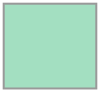

In [47]:

polygon = Polygon([(w, s), (w, n), (e, n), (e, s)])

polygon


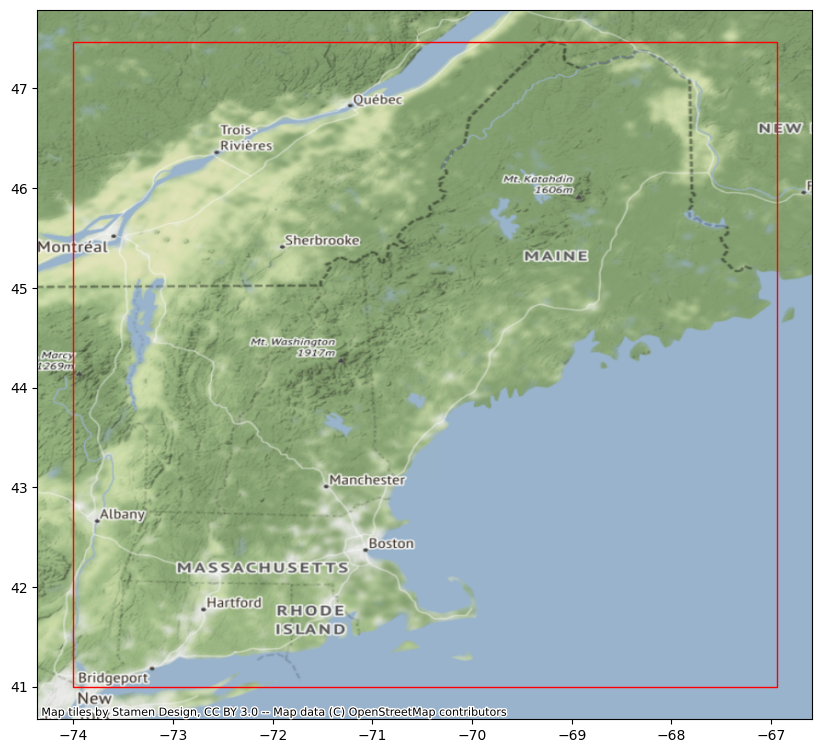

In [48]:

gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

fig, ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax, facecolor='none', edgecolor='red')

ctx.add_basemap(ax, crs=gdf.crs.to_string())

plt.show()


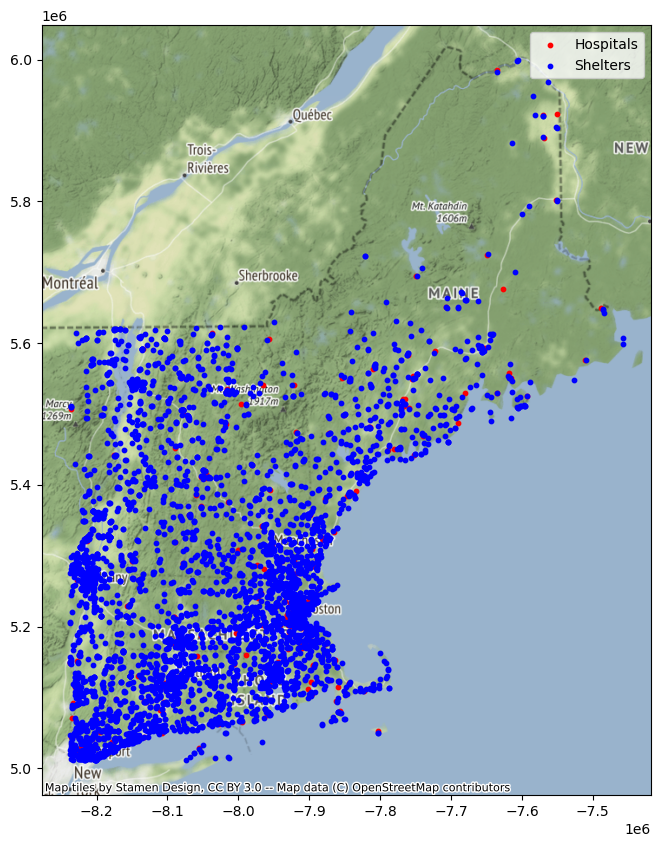

In [49]:
fig, ax = plt.subplots(figsize=(10,10))

hospitals_gdf.to_crs(epsg=3857).plot(ax=ax, color='red', markersize=10, label='Hospitals')

shelters_gdf.to_crs(epsg=3857).plot(ax=ax, color='blue', markersize=10, label='Shelters')

ctx.add_basemap(ax)

plt.legend()

plt.show()

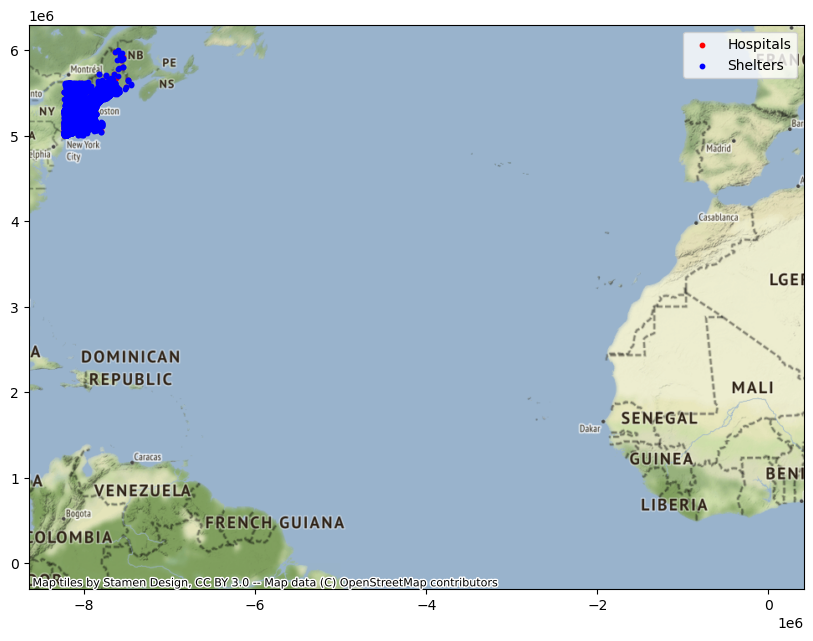

In [50]:
polygon = Polygon([(w, s), (w, n), (e, n), (e, s)])

polygon



gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:3857", geometry=[polygon])

fig, ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax, facecolor='none', edgecolor='red')
hospitals_gdf.to_crs(epsg=3857).plot(ax=ax, color='red', markersize=10, label='Hospitals')
shelters_gdf.to_crs(epsg=3857).plot(ax=ax, color='blue', markersize=10, label='Shelters')



ctx.add_basemap(ax)
plt.legend()

plt.show()

/tmp/ipykernel_637/1610112463.py:13: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


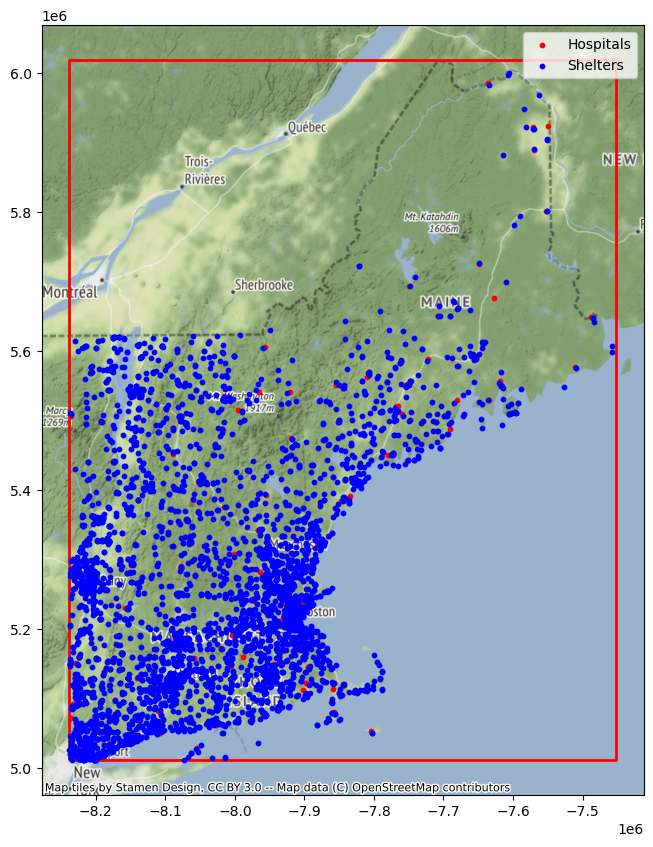

In [51]:
bounding_box_gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

fig, ax = plt.subplots(figsize=(10,10))

bounding_box_gdf.to_crs(epsg=3857).plot(ax=ax, color='none', edgecolor='red', linewidth=2, label='Bounding Box')

hospitals_gdf.to_crs(epsg=3857).plot(ax=ax, color='red', markersize=10, label='Hospitals')

shelters_gdf.to_crs(epsg=3857).plot(ax=ax, color='blue', markersize=10, label='Shelters')

ctx.add_basemap(ax)

plt.legend()

plt.show()

/tmp/ipykernel_637/4030151937.py:24: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


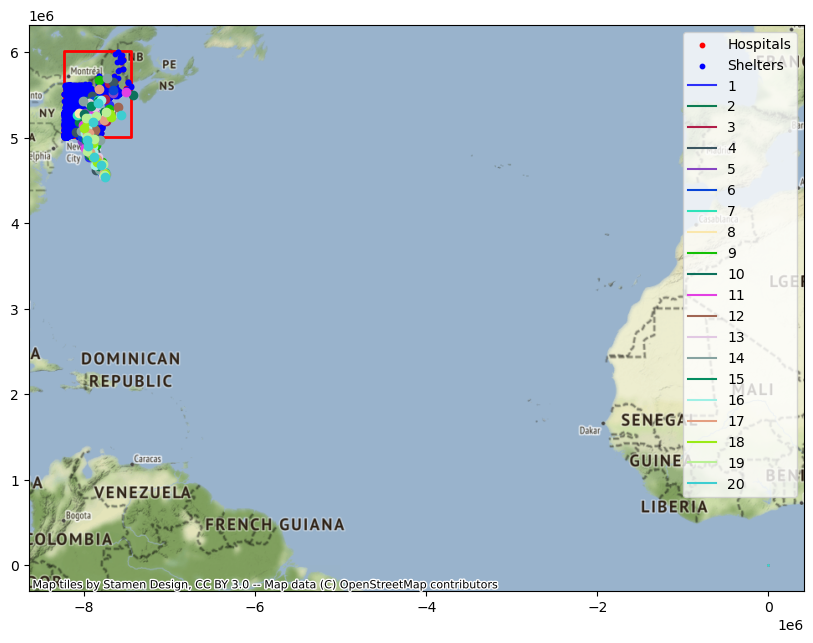

In [52]:
bounding_box_gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

fig, ax = plt.subplots(figsize=(10,10))

# Plot the bounding box
bounding_box_gdf.to_crs(epsg=3857).plot(ax=ax, color='none', edgecolor='red', linewidth=2, label='Bounding Box')

# Plot the hospitals
hospitals_gdf.to_crs(epsg=3857).plot(ax=ax, color='red', markersize=10, label='Hospitals')

# Plot the shelters
shelters_gdf.to_crs(epsg=3857).plot(ax=ax, color='blue', markersize=10, label='Shelters')

# Plot the hurricane predictions
for pred_id, pred in day1_forecast.groupby('prediction'):
    c = random_color()
    pred.to_crs(epsg=3857).plot(color=c, ax=ax)
    line_to_plot = LineString(pred.geometry.values)
    ax.plot(line_to_plot.xy[0], line_to_plot.xy[1], color=c, label=f'{pred_id}')


    
# Add the legend
ax.legend()

# Add basemap
ctx.add_basemap(ax)

plt.show()


/tmp/ipykernel_637/2595595627.py:14: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


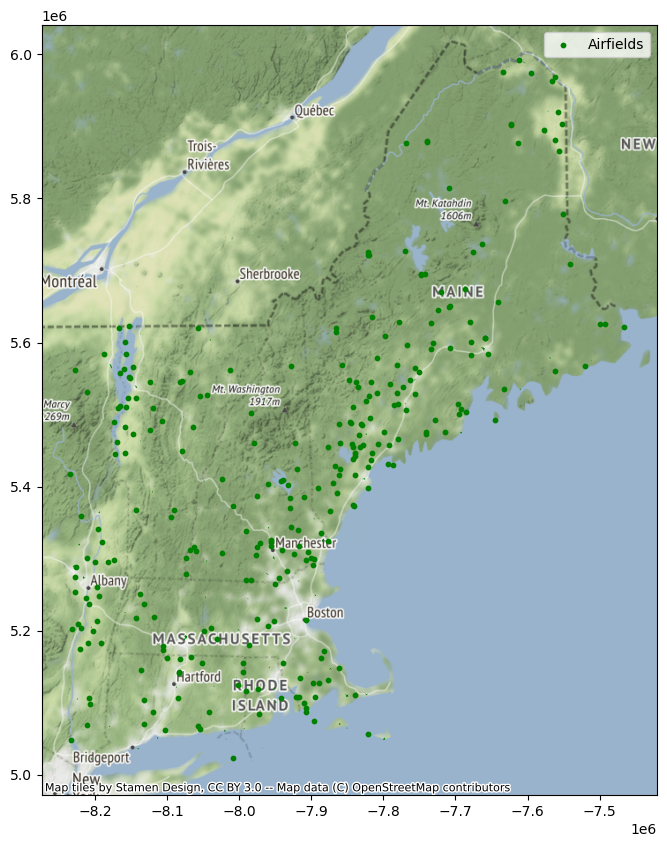

In [53]:
#AIRFIELDS GEODATAFRAMES

import osmnx as ox

airfields = ox.features.features_from_polygon(polygon, tags={'aeroway': 'aerodrome'}) #polygon is the bound-box

us_airfields = airfields.loc[airfields['addr:state'].isnull() == False] #removes airports without state to isolatew within us bounds\

fig, ax = plt.subplots(figsize=(10,10))

us_airfields.to_crs(epsg=3857).plot(ax=ax, color='green', markersize=10, label='Airfields')
ctx.add_basemap(ax)

plt.legend()

plt.show()

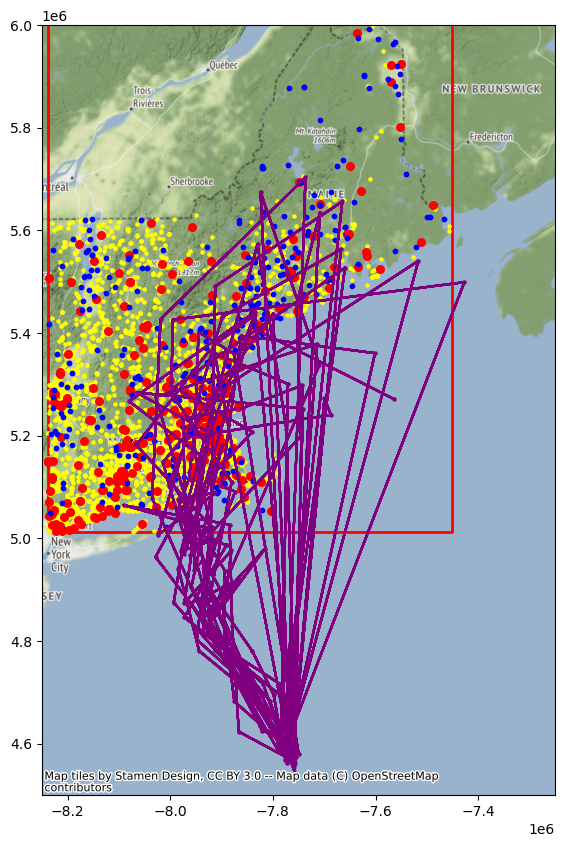

In [54]:
bounding_box_gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

fig, ax = plt.subplots(figsize=(10,10))

# Plot the bounding box
bounding_box_gdf.to_crs(epsg=3857).plot(ax=ax, color='none', edgecolor='red', linewidth=2, label='Bounding Box')

# Plot the shelters
shelters_gdf.to_crs(epsg=3857).plot(ax=ax, color='yellow', markersize=5, label='Shelters')

# Plot the hospitals
hospitals_gdf.to_crs(epsg=3857).plot(ax=ax, color='red', markersize=30, label='Hospitals')

# Plot the hurricane predictions
for pred_id, pred in day1_forecast.groupby('prediction'):
    pred.to_crs(epsg=3857).plot(color='purple', markersize=5, ax=ax)
    line_to_plot = LineString(day1_forecast.geometry.values)
    line_gdf = gpd.GeoDataFrame(geometry=[line_to_plot], crs="EPSG:4326")
    line_gdf = line_gdf.to_crs(epsg=3857)
    line_gdf.plot(color='purple', ax=ax, label='LineString')
    
us_airfields.to_crs(epsg=3857).plot(ax=ax, color='blue', markersize=10, label='Airfields')
us_airfields.loc[us_airfields['name'] == 'Westover Air Reserve Base'].to_crs(epsg=3857).plot(ax=ax, color='black', markersize=10, label='Westover')

ctx.add_basemap(ax)

plt.axis([-8250000,-7250000,4500000,6000000])

plt.show()

## Get the cells neighboring each cell
Buffer and use spatial join with `overlap` to find which cells are neighboring each other

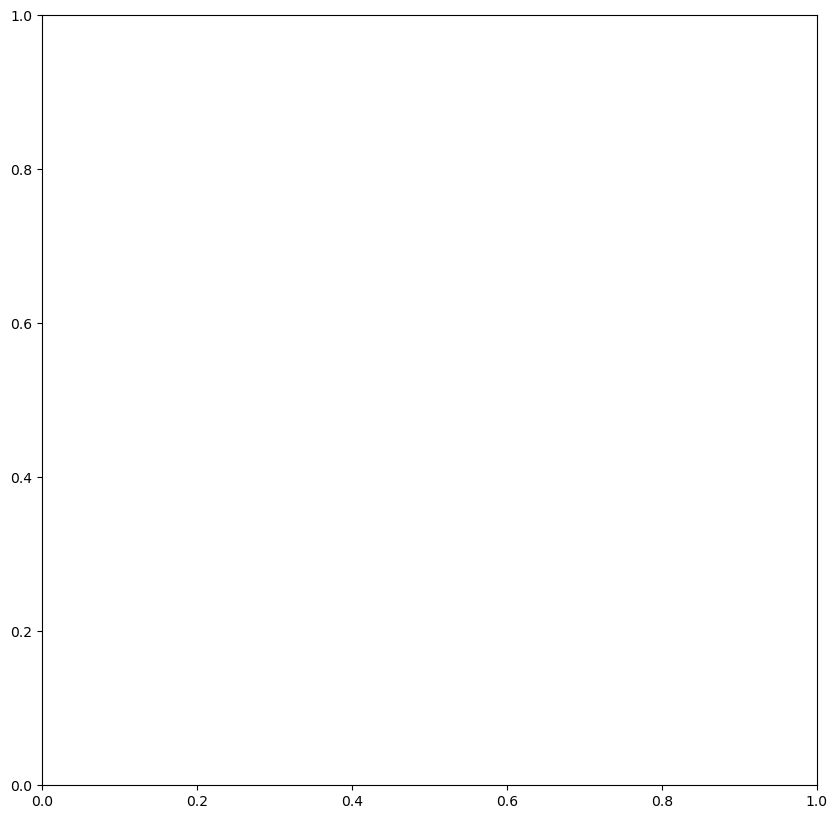

In [55]:
import folium

bounding_box_gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

fig, ax = plt.subplots(figsize=(10,10))

# Plot the bounding box
exploremap = bounding_box_gdf.explore()

exploremap = hospitals_gdf[['ID', 'NAME','ADDRESS','STATE','geometry']].explore(m=exploremap, color = 'red', name= 'hospitals', style_kwds = {'weight':5})
exploremap = shelters_gdf[['SHELTER_ID','SHELTER_NAME','ADDRESS_1','STATE','geometry']].explore(m=exploremap, color = 'blue', name= 'shelters', style_kwds = {'weight':5})
exploremap = us_airfields[['name','addr:state','geometry']].explore(m=exploremap, name= 'airfields', color = 'green', style_kwds = {'weight':5})
# Plot the hurricane predictions
for pred_id, pred in day1_forecast.groupby('prediction'):
    pred['datetime'] = pred['datetime'].astype('str')
    exploremap = pred[['prediction', 'geometry']].explore(m=exploremap, color = 'purple')
    line_to_plot = LineString(day1_forecast.geometry.values)
    line_gdf = gpd.GeoDataFrame(geometry=[line_to_plot], crs="EPSG:4326")
    line_gdf = line_gdf.to_crs(epsg=3857)
    exploremap = line_gdf.explore(m=exploremap, color = 'purple')
    
# us_airfields.loc[us_airfields['name'] == 'Westover Air Reserve Base'].to_crs(epsg=3857).plot(ax=ax, color='black', markersize=10, label='Westover')
folium.LayerControl().add_to(exploremap)
exploremap

In [56]:
# Reset map variable
airmap = folium.Map()

# Add hospital, shelter, and airfield data
airmap = hospitals_gdf[['ID', 'NAME','ADDRESS','STATE','geometry']].explore(m=airmap, color = 'red', name= 'hospitals', style_kwds = {'weight':.3})
airmap = shelters_gdf[['SHELTER_ID','SHELTER_NAME','ADDRESS_1','STATE','geometry']].explore(m=airmap, color = 'blue', name= 'shelters', style_kwds = {'weight':.3})
airmap = us_airfields[['geometry', 'addr:state', 'aeroway', 'faa', 'name']].explore(m=airmap, name= 'airfields', color = 'green', style_kwds = {'weight':2})

paths_arr = []
for pred_id, pred in day1_forecast.groupby('prediction'):
    line_to_plot = LineString(pred.geometry.values)
    paths_arr.append({'prediction': pred_id, 'geometry':line_to_plot})
paths_df = gpd.GeoDataFrame(paths_arr)

airmap = day1_forecast[['prediction','forecastHour','maxWinds','category','geometry']].explore('prediction', m = airmap, name = 'points', legend = False)
airmap = paths_df.explore('prediction', m= airmap, name= 'paths')
# Add bounding box
bounding_box_gdf = folium.Rectangle([[s,w],[n,e]]) 
airmap.add_child(bounding_box_gdf)

# Set default bounds
airmap.fit_bounds([[s,w],[n,e]]) 
airmap

In [57]:
buffered_game_grid = game_grid.to_crs('epsg:3857')
buffered_game_grid.geometry = buffered_game_grid.buffer(10)
neighboring_gdf = gpd.sjoin(buffered_game_grid, game_grid.to_crs('epsg:3857'), predicate='overlaps')

In [58]:
neighboring_gdf

,EASTING_left,NORTHING_left,kmSQ_ID_left,GZD_left,Shape_Leng_left,MGRS_left,MGRS_10km_left,transport_score_left,geometry,index_right,EASTING_right,NORTHING_right,kmSQ_ID_right,GZD_right,Shape_Leng_right,MGRS_right,MGRS_10km_right,transport_score_right
0,596000mE,4984000mN,WQ,18T,400000.000000,18TWQ9684,18TWQ98,1,"POLYGON ((-8211941.372 5621964.655, -8211941.4...",20,595000mE,4983000mN,WQ,18T,400000.000000,18TWQ9583,18TWQ98,1
19,594000mE,4983000mN,WQ,18T,400000.000000,18TWQ9483,18TWQ98,1,"POLYGON ((-8214786.705 5620590.448, -8214786.7...",20,595000mE,4983000mN,WQ,18T,400000.000000,18TWQ9583,18TWQ98,1
21,596000mE,4983000mN,WQ,18T,400000.000000,18TWQ9683,18TWQ98,1,"POLYGON ((-8211962.822 5620547.855, -8211962.8...",20,595000mE,4983000mN,WQ,18T,400000.000000,18TWQ9583,18TWQ98,1
40,594000mE,4982000mN,WQ,18T,400000.000000,18TWQ9482,18TWQ98,1,"POLYGON ((-8214807.702 5619173.847, -8214807.7...",20,595000mE,4983000mN,WQ,18T,400000.000000,18TWQ9583,18TWQ98,1
41,595000mE,4982000mN,WQ,18T,400000.000000,18TWQ9582,18TWQ98,1,"POLYGON ((-8213395.977 5619152.672, -8213396.0...",20,595000mE,4983000mN,WQ,18T,400000.000000,18TWQ9583,18TWQ98,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232564,284000mE,4558000mN,BF,19T,0.041828,19TBF8458,19TBF85,1,"POLYGON ((-7966228.122 5033729.753, -7966228.1...",232565,285000mE,4558000mN,BF,19T,0.041828,19TBF8558,19TBF85,1
232566,286000mE,4558000mN,BF,19T,0.041829,19TBF8658,19TBF85,1,"POLYGON ((-7963577.664 5033807.714, -7963577.6...",232565,285000mE,4558000mN,BF,19T,0.041828,19TBF8558,19TBF85,1
232559,285000mE,4559000mN,BF,19T,0.041832,19TBF8559,19TBF85,2,"POLYGON ((-7964941.744 5035099.209, -7964941.7...",232566,286000mE,4558000mN,BF,19T,0.041829,19TBF8658,19TBF85,1
232560,286000mE,4559000mN,BF,19T,0.041832,19TBF8659,19TBF85,1,"POLYGON ((-7963616.325 5035138.116, -7963616.3...",232566,286000mE,4558000mN,BF,19T,0.041829,19TBF8658,19TBF85,1


## Create network representation

In [ ]:
transport_network = networkx.DiGraph()
transport_network.add_nodes_from(game_grid['MGRS']) #add nodes, 1 for every entry of MGRS
# calculate travel time as an edge feature
neighboring_gdf['travel_time'] = 20/ (neighboring_gdf['transport_score_left'] + neighboring_gdf['transport_score_right'])
# create edges from (origin, destination, travel_time)
transport_network.add_weighted_edges_from(zip(neighboring_gdf['MGRS_left'], neighboring_gdf['MGRS_right'], neighboring_gdf['travel_time']))

In [ ]:
networkx.write_graphml(transport_network, 'transport_network_pre.graphml')

In [ ]:
transport_network_loaded = networkx.read_graphml('transport_network_pre.graphml')

## Visualizing the transport score
Highways and major roads have highest transport score. Rural areas have lowest transport score. Cities have intermediate transport score to model local roads

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
game_grid.plot(column='transport_score', ax=ax)
plt.show()

In [ ]:
# plotting a route
def plot_route(game_grid, transport_network, route, ax, buffer=0.01, color=None):
    '''
    plots a route on the game_grid network
    
    game_grid: gdf of the game grid
    transport_network: networkx object representing network
    route: list of MGRS ID's of shelters in order of the route
    buffer: how much to buffer the routes for visibility
    ax: matplotlib axes object to plot on
    color: color of the route to plot
    '''
    if color == None:
        color = np.random.random(3)
    full_route = []
    for idx in range(len(route)-1):
        orig = route[idx]
        dest = route[idx+1]
        full_route = full_route + networkx.astar_path(transport_network, orig, dest)
    game_grid.set_index('MGRS').loc[full_route].buffer(buffer).plot(ax=ax, color=color)

In [ ]:
# example of plotting transport score and route
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1)
game_grid.plot(column='transport_score', cmap='Greys', alpha=0.8, ax=ax)
#plotting for random origin and destination for reference
plot_route(game_grid,
           transport_network, 
           [np.random.choice(game_grid['MGRS']),
            np.random.choice(game_grid['MGRS'])],
           ax=ax,
           buffer=0.01)
ctx.add_basemap(ax,
                crs=game_grid.crs,
                source=ctx.providers.Stamen.TonerBackground)
ax.set_xlim([w,e]) # from overall bounds
ax.set_ylim([s,n])
plt.show()

In [ ]:
day2_forecast = gpd.read_file('https://files.bwsi-remote-sensing.net/data/final/day2/day2_forecasts_2023.geojson')

In [ ]:
# # Algorithm
# hospital1 = hospitals_gdf.head(300)
# shelter1 = shelters_gdf.head(300)

# names = ['Westover Air Reserve Base', 'Berlin Municipal Airport', 'Stormville Airport', 'Rutland-Southern Vermont Regional Airport', 'Newton Field'] #replace list with list of names
# resources = [37500, 37500, 45000, 22500, 7500]
# names_of_airport = pd.DataFrame({'name': names, 'resources': resources})
# centers = centers.sjoin(game_grid, how = 'inner', on = 'intersects')
# centers = centers.drop_duplicates('name')

# trucks = []
# for i in range(9):
#     trucks.append({'resources': 1200, 'time': 12, 'start': centers.iloc[2]['nodes']})
# resources[0] -= 1200*9
# for i in range(9):
#     trucks.append({'resources': 1200, 'time': 12, 'start': centers.iloc[1]['nodes']})
# resources[1] -= 1200*9
# for i in range(11):
#     trucks.append({'resources': 1200, 'time': 12, 'start': centers.iloc[4]['nodes']})
# resources[2] -= 1200*11
# for i in range(7):
#     trucks.append({'resources': 1200, 'time': 12, 'start': centers.iloc[3]['nodes']})
# resources[3] -= 1200*7
# for i in range(4):
#     trucks.append({'resources': 1200, 'time': 12, 'start': centers.iloc[0]['nodes']})
# resources[4] -= 1200*4

In [ ]:
# each forecast report has a number of possible hurricane routes
# they are identified by the prediction column
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for pred_id, pred in day1_forecast.groupby('prediction'):
    c = random_color()
    pred.plot(color=c, ax=ax)
    line_to_plot = LineString(pred.geometry.values)
    ax.plot(line_to_plot.xy[0], line_to_plot.xy[1], color=c, label=f'{pred_id}')
ax.legend(title='prediction id')
ctx.add_basemap(ax, crs = day2_forecast.crs)

In [ ]:
import folium

bounding_box_gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[polygon])

fig, ax = plt.subplots(figsize=(10,10))

# Plot the bounding box
exploremap = bounding_box_gdf.explore()

exploremap = hospitals_gdf[['ID', 'NAME','ADDRESS','STATE','geometry']].explore(m=exploremap, color = 'red', name= 'hospitals', style_kwds = {'weight':5})
exploremap = shelters_gdf[['SHELTER_ID','SHELTER_NAME','ADDRESS_1','STATE','geometry']].explore(m=exploremap, color = 'blue', name= 'shelters', style_kwds = {'weight':5})
exploremap = us_airfields[['name','addr:state','geometry']].explore(m=exploremap, name= 'airfields', color = 'green', style_kwds = {'weight':5})
# Plot the hurricane predictions
for pred_id, pred in day2_forecast.groupby('prediction'):
    pred['datetime'] = pred['datetime'].astype('str')
    exploremap = pred[['prediction', 'geometry']].explore(m=exploremap, color = 'purple')
    line_to_plot = LineString(day2_forecast.geometry.values)
    line_gdf = gpd.GeoDataFrame(geometry=[line_to_plot], crs="EPSG:4326")
    line_gdf = line_gdf.to_crs(epsg=3857)
    exploremap = line_gdf.explore(m=exploremap, color = 'purple')
    
# us_airfields.loc[us_airfields['name'] == 'Westover Air Reserve Base'].to_crs(epsg=3857).plot(ax=ax, color='black', markersize=10, label='Westover')
folium.LayerControl().add_to(exploremap)
exploremap

In [ ]:
from shapely.geometry import Point, LineString, MultiPolygon

fig, ax = plt.subplots(1, 1, figsize=(10,10))
all_centroid = []
all_points = []

for pred_id, pred in day1_forecast.groupby('forecastHour'):
    c = random_color()
    pred.plot(color=c, ax=ax)
    line_to_plot = LineString(pred.geometry.values)
    ax.plot(line_to_plot.xy[0], line_to_plot.xy[1], color=c, label=f'{pred_id}')
    all_points.append(pred.geometry.values)
    
    l_centroid = line_to_plot.centroid
    l_centroid_x, l_centroid_y = l_centroid.xy
    ax.plot(l_centroid_x, l_centroid_y, 'ro', markersize=10)
    centroid = Point(l_centroid_x,l_centroid_y)
    all_centroid.append(centroid)
    
ax.legend(title='forecastHr')


In [62]:
day2_forecast = gpd.read_file('https://files.bwsi-remote-sensing.net/data/final/day2/day2_forecasts_2023.geojson')

In [63]:
list_shelters = ['GRANBY MIDDLE SCHOOL',
 'WATERVLIET CIVIC CENTER',
 'Madison School',
 'Holy Family School',
 'Avon High School',
 'Saint Pauls Episcopal Church',
 'MAPLE HILL HIGH SCHOOL',
 'First Presbyterian Church',
 'Notre Dame Catholic High School',
 'Stratford Ng Armory',
 'Fairfield Ludlowe High School',
 'Fairfield Woods Middle School',
 'National Guard Armory - Waterbury, CT',
 'Central High School',
 'Black Rock School',
 'North Branch Library',
 'Hall School',
 'Hallen School',
 'Bridgeport Police Community Center',
 'Wooster Middle School',
 'St. Pius X School',
 'Blackham School',
 'STAPLES HIGH SCHOOL',
 'Beardsley School',
 'Granby High School',
 'Coleytown Elementary',
 'Second Lane School',
 'Calvary Evengelical Church',
 'Bassick High School',
 'Westmere Elementary School',
 'Geraldine Johnson High School',
 'Weston Middle School',
 'Read School',
 'Jennings School',
 'Jockey Hollow School',
 'Thomas Hooker School',
 'Brien McMahon High School',
 'Beacon Hill Evangelical Free Church',
 'Our Lady Of Assumption School',
 'Dunbar School',
 'Thompson Brook',
 'Coleytown Middle School',
 'John Winthrop School',
 'DEPAOLO MIDDLE SCHOOL',
 'Cross School',
 'Curiale Elementary',
 'Wilton Miller School',
 'Fairfield Warde High School',
 'Park City Magnet School',
 'Monroe Senior Center',
 'Hatten Elementary School',
 'Southington High School',
 'Dwight Elementary School',
 'Flood Junior High School',
 'Granby Senior Center',
 'Classical Studies Academy',
 'Skane School',
 'AVON FIRE CO #1',
'Pine Grove Elementary School',
 'Luis Munoz Marin Schol',
 'Long Lots School',
 "BH-BL O'Rourke Middle School",
 'North End Bethany Senior Center',
 'Delmar Reformed Church',
 'Lutheran Church Of The Good Shepherd',
 'FAITH UNITED METHODIST CHURCH',
 'Bethlehem High School',
 'Wilton Ymca',
'SADDLEWOOD ELEMENTARY SCHOOL',
 'RENSSELAER VOLUNTEER AMBULANCE SQUAD',
 'WHITE PLAINS SENIOR HIGH SCHOOL',
 'ELSMERE ELEMENTARY SCHOOL',
 'TRINITY BAPTIST CHURCH',
 'CONGREGATION BETH EMETH',
 'EMMANUEL BAPTIST CHURCH',
 'SLINGERLANDS ELEMENTARY SCHOOL',
 'ALBANY HIGH SCHOOL (Albany NY)',
 'BETHLEHEM MIDDLE SCHOOL',
 'Albany School Of Humanities (ASH)',
 'Salem United Methodist Church',
 'Harriet Gibbons School',
 'ABROOKIN VO-TECH CENTER',
 'Heath Senior Center',
'Cario-Durham Middle School',
 'North Greenbush School',
 "SAINT JOHN'S EVANGELICAL LUTHERAN CHURCH",
 'Eisenhower Center',
 'Edison School',
 'Central Ct. State University',
 'FARNSWORTH MIDDLE SCHOOL',
 'Avon Senior Center',
 'J F K MIDDLE SCHOOL',
 'CASTLETON ELEMENTARY SCHOOL',
 'PINE BUSH ELEMENTARY SCHOOL',
 'WILTON HIGH SCHOOL',
 'Masuk High School',
 'Stamford Elementary School',
 'Helen Keller Middle School',
 'Eastern Parkway United Methodist Church',
 'Delaware Community School (aka - PS18)',
 'Speigletown Fire Co.',
 'American Legion Legnard Curtin Post 927',
 'Giffen Memorial School',
 'Trumbull High School',
 'Boght Elementary School',
 'COHOES MIDDLE SCHOOL',
 'Seymour High School',
 'City Hall',
 'Bethlehem Community Church',
 'PHILLIP SCHUYLER ACHIEVEMENT ACADEMY',
 'Philip Schuyler Elementary School',
 'Roessleville School',
 "TROY BOY'S AND GIRL'S CLUB",
 'TROY SCHOOL #12',
 'TROY SCHOOL #1',
 'UNITED CHURCH OF COHOES',
 'VICTORY CHRISTIAN CHURCH',
 'PITTSTOWN UNITED METHODIST CHURCH',
 'Pine Hills Elementary',
 'Cohoes Van Schaick Grade School',
 'PINEWOOD ELEMENTARY SCHOOL',
 'Shaker Junior High School',
 'Watervliet Elks Lodge 1500',
 'Southgate Elementary School',
 'Eagle Point Elementary',
 'New Scotland Elementary',
 'Union Missionary Baptist Church (Albany NY)',
 'TROY SCHOOL #2',
 'SHERIDAN PREPARATORY ACADEMY',
 'Voorheesville Elementary School',
 'SHAKER SENIOR HIGH SCHOOL',
 'DRAPER MIDDLE SCHOOL',
 'Calvary Baptist Church',
 'North Albany Academy',
 'Hoosick Armory Youth Center & Community Coalition',
 'Hoosic Valley Jr/Sr High School',
 'House Of Praise Church',
 'HAMAGRAEL ELEMENTARY SCHOOL',
'HACKETT MIDDLE SCHOOL',
 'Tamarac (Brittonkill)  Middle And Senior High School',
 'Blue Creek School',
 'SCHENECTADY CHURCH OF THE NAZARENE',
 'Schenectady DPW',
 'Mt. Pleasant Community Center',
 'United Pentecostal Church',
 'GARDNER-DICKINSON SCHOOL',
 'Lake Garda Elementary School',
 'Cohoes CSD Harmony Hill School',
 'Hitchcock Presbyterian Church',
 'Reach Out Church',
 'Trumbull Senior Center',
'MOHONASEN HIGH SCHOOL',
 'Cohoes CSD Abram Lansing School',
 'SCOTIA GLENVILLE SENIOR HIGH SCHOOL',
 'Questar 3',
 'Capital Region Prayer And Healing Center',
 'LISHA KILL MIDDLE SCHOOL',
 'Catskill Masonic Lodge #468',
 'FOREST PARK ELEMENTARY SCHOOL',
 'The First Reformed Church Of Scotia',
 'Light Of The World Christian Church',
 'Livingston Middle School',
 'Lapham Senior Center',
 'Latham Ridge Elementary School',
 'BH-BL Pashley Elementary School',
 'Voorheesville Central School/clayton Bouton High School',
 'Maplewood Elementary School',
 'Samuel Staples School',
 'Black Rock Congregational Church',
 'Madison Middle School',
 'Mt Anthony Union Middle School',
 'Mid-hudson Civic Center',
 'Mount Kisco Boys & Girls Club',
 'Muriel Morabito Community Ctr.',
 'Guilderland Elementary School',
 'Benedictine  Hospital Campus',
 'Lanesborough Elementary School',
 'St. Elizabeth Parish Center',
 'Waterbury Magnet School',
 'Jepsen Trailer Park Recreation Center',
 'Mt. Pleasant Community Center',
 'Taconic DDSO',
 'Drury High School',
 'Reid Middle School',
 'Ridgefield Senior Center',
 'North Haven HS',
 'Eli Terry Middle School',
 'Pomperaug High School',
 'Ben Jepson School',
 'Derby Middle School',
 'Harwinton Senior Center',
 'Harwinton Consolidated School',
 'Woodlawn High School',
 'West Stockbridge Town Hall',
 'Cummington Public Safety Complex',
 'Sanderson Academy',
 'COHOES HIGH SCHOOL',
 'Norwalk High School',
 'FIRST BAPTIST CHURCH OF HOOSICK',
 'Bunnell High School',
 'BARKHAMSTED EAST FIREHOUSE',
 'North Hoosick Fire Department',
 'Tsatsawassa Protective Fire Company',
 'Union College Memorial Field House',
 'Ravena-coeymans-selkirk High School',
 'Stratford High School',
 'GLENMONT ELEMENTARY SCHOOL',
 'MOUNT MORIAH MINISTRIES',
 'High Horizon/multi-cultural Magnet School Campus',
 "Albany County Sheriff's Office",
 'Bethlehem CSD Eagle Elementary',
 'New Baltimore Fire House Station 1',
 'HARVEST TIME CHURCH',
 'Pearl River Middle School',
 'South Orangetown Middle School',
 'West Haverstraw Village Hall',
 'Twin Valley Middle High School',
 'Hillcrest Middle School',
 'Culinary Institute of America',
 'New Fairfield Senior Center',
 'Winchester Grange',
 'Frisbie Elementary School',
 'Wakelee Elementary School']

In [64]:
import folium
#create geodataframe with desired airports
airport_list = ['Westover Air Reserve Base', 'Berlin Municipal Airport', 'Rutland-Southern Vermont Regional Airport', 'Newton Field', 'Stormville Airport'] #replace list with list of names
names_of_airports = pd.DataFrame({'name': airport_list})
selected_airfields_gdf = us_airfields.reset_index().merge(names_of_airports, how = 'inner', on = 'name')

#geodataframe of selected shelters (switched from day1 to day2)
names_of_shelters = pd.DataFrame({'name': list_shelters})
selected_shelters_gdf = shelters_gdf.merge(names_of_shelters, how = 'inner' , left_on = 'SHELTER_NAME', right_on = 'name')

#create geodataframe of hurricane paths 
paths_arr = []
for pred_id, pred in day2_forecast.groupby('prediction'):
    line_to_plot = LineString(pred.geometry.values)
    paths_arr.append({'prediction': pred_id, 'geometry':line_to_plot})
paths_df = gpd.GeoDataFrame(paths_arr)

#create geodataframe using cone of uncertainty (invalid for day 2)
# cone_of_uncertainty = gpd.GeoDataFrame(geometry = [all_forecasts])
# cone_of_uncertainty.loc[0, 'hurricane'] = 'hurricane'
# Reset map variable
airmap = folium.Map()

In [65]:
# Add hospital, shelter, and airfield data
airmap = hospitals_gdf[['ID', 'NAME','ADDRESS','STATE','geometry']].explore(m=airmap, color = 'red', name= 'hospitals', style_kwds = {'weight':.3})
airmap = shelters_gdf[['SHELTER_ID','SHELTER_NAME','ADDRESS_1','STATE','geometry']].explore(m=airmap, color = 'blue', name= 'shelters', style_kwds = {'weight':.3})
#airmap = us_airfields[['geometry', 'addr:state', 'aeroway', 'faa','name']].explore(m=airmap, name= 'airfields', color = 'green', style_kwds = {'weight':2})
airmap = selected_airfields_gdf[['geometry', 'addr:state', 'aeroway', 'faa','name']].explore(m= airmap, name= 'distribution centers', color = 'brown', style_kwds = {'weight':10})
#airmap = selected_shelters_gdf[['SHELTER_ID','SHELTER_NAME','ADDRESS_1','STATE','geometry']].explore(m= airmap, name= 'shelters_selected', color = '#0ca6a1', style_kwds = {'weight':3})

#add hurricane path
airmap = day2_forecast[['prediction','forecastHour','maxWinds','category','geometry']].explore('prediction', m = airmap, name = 'points', legend = False) #changed from day 1 to day 2
airmap = paths_df.explore('prediction', m= airmap, name= 'paths')

#add hurricane shape
#airmap = cone_of_uncertainty.explore(m=airmap, color = 'yellow', style_kwds = {'opacity':.22, 'fillOpacity':.22, 'fillColor': 'yellow'}, name = 'storm')

# Add bounding box
bounding_box_gdf = folium.Rectangle([[s,w],[n,e]]) 
airmap.add_child(bounding_box_gdf)

# Set default bounds
airmap.fit_bounds([[s,w],[n,e]]) 

#add layers
folium.LayerControl().add_to(airmap)
airmap

In [ ]:
#update hospital, shelter, and airfield data (uses planning team data, invalid for day 2)
# hospitals_gdf['affected?'] = shapely.intersects(hospitals_gdf['geometry'], all_forecasts)
# shelters_gdf['affected?'] = shapely.intersects(shelters_gdf['geometry'], all_forecasts)
# us_airfields['affected?'] = shapely.intersects(us_airfields['geometry'], all_forecasts)

#add msrg indicies
shelters_merged = shelters_gdf.sjoin(game_grid, how = "left", predicate = "intersects")
shelters_merged = shelters_merged.drop_duplicates('SHELTER_ID')
hospitals_merged = hospitals_gdf.sjoin(game_grid, how = "left", predicate = "intersects")
hospitals_merged = hospitals_merged.drop_duplicates('ID')
airfields_merged = us_airfields.sjoin(game_grid, how ='left', predicate = "intersects")
airfields_merged = airfields_merged.reset_index().drop_duplicates('osmid')

#create geodataframe with desired airports
airport_list = ['Westover Air Reserve Base', 'Berlin Municipal Airport', 'Stormville Airport', 'Rutland-Southern Vermont Regional Airport', 'Newton Field']
names_of_airports = pd.DataFrame({'name': airport_list})
selected_airfields_gdf = airfields_merged.reset_index().merge(names_of_airports, how = 'inner', on = 'name')

#geodataframe of selected shelters (switched from day1 to day2)
names_of_shelters = pd.DataFrame({'name': list_shelters})
selected_shelters_gdf = shelters_merged.merge(names_of_shelters, how = 'inner' , left_on = 'SHELTER_NAME', right_on = 'name')

#create geodataframe of hurricane paths 
paths_arr = []
for pred_id, pred in day1_forecast.groupby('prediction'):
    line_to_plot = LineString(pred.geometry.values)
    paths_arr.append({'prediction': pred_id, 'geometry':line_to_plot})
paths_df = gpd.GeoDataFrame(paths_arr)

paths_arr2 = []
for pred_id, pred in day2_forecast.groupby('prediction'):
    line_to_plot = LineString(pred.geometry.values)
    paths_arr2.append({'prediction': pred_id, 'geometry':line_to_plot})
paths_df_2 = gpd.GeoDataFrame(paths_arr2)

#create geodataframe using cone of uncertainty (invalid for day 2)
# cone_of_uncertainty = gpd.GeoDataFrame(geometry = [all_forecasts])
# cone_of_uncertainty.loc[0, 'hurricane'] = 'hurricane'

In [ ]:
#Reset map variable
airmap = folium.Map()

# Add hospital, shelter, and airfield data
# airmap = hospitals_merged[['ID', 'NAME','ADDRESS','STATE','geometry', 'MGRS']].explore(m=airmap, color = 'red', name= 'hospitals', style_kwds = {'weight':.3})
# airmap = shelters_merged[['SHELTER_ID','SHELTER_NAME','ADDRESS_1','STATE','geometry', 'MGRS']].explore(m=airmap, color = 'blue', name= 'shelters', style_kwds = {'weight':.3})
# airmap = airfields_merged[['geometry', 'addr:state', 'aeroway', 'faa', 'name', 'MGRS']].explore(m=airmap, name= 'airfields', color = 'green', style_kwds = {'weight':2})
airmap = selected_airfields_gdf[['geometry', 'addr:state', 'aeroway', 'faa', 'name', 'MGRS']].explore(m= airmap, name= 'distribution centers', color = 'brown', style_kwds = {'weight':10})
airmap = selected_shelters_gdf[['SHELTER_ID','SHELTER_NAME','ADDRESS_1','STATE','geometry', 'MGRS']].explore(m= airmap, name= 'shelters_selected', color = '#0ca6a1', style_kwds = {'weight':3})

#add hurricane path
#airmap = day2_forecast[['prediction','forecastHour','maxWinds','category','geometry']].explore('prediction', m = airmap, name = 'points', legend = False) #changed from day 1 to day 2
airmap = paths_df.explore(m= airmap, name= 'd1paths', color = 'yellow') #'prediction'
airmap = paths_df_2.explore(m= airmap, name= 'd2paths', color = 'purple')

#add hurricane shape
#airmap = cone_of_uncertainty.explore(m=airmap, color = 'yellow', style_kwds = {'opacity':.22, 'fillOpacity':.22, 'fillColor': 'yellow'}, name = 'storm')

# Add bounding box
bounding_box_gdf = folium.Rectangle([[s,w],[n,e]]) 
airmap.add_child(bounding_box_gdf)

# Set default bounds
airmap.fit_bounds([[s,w],[n,e]]) 

#add layers
folium.LayerControl().add_to(airmap)
airmap

In [ ]:
def minimize(places, truck):
    # calling shortest_path

def restock(center, truck):
    truck['time'] = 12
    truck['start'] = center
    if(center['resources'] > (1200 - truck['resources'])):
        center['resources'] -= (1200 - truck['resources'])
        truck['resources'] = 1200
    else:
        truck['resources'] += center['resources']
        center['resources'] = 0

def deliver(isShelter, place, truck):
    if isShelter:
        truck['resources'] -= 200
        truck['time'] -= (minimize() + 0.33)
        plot_route(game_grid, transport_network, [truck['start'], place], ax=ax, buffer=0.01)
        truck['start'] = place
        shelters.remove(place)
    else:
        truck['resources'] -= 500
        truck['time'] -= (minimize() + 1)
        plot_route(game_grid, transport_network, [truck['start'], place], ax=ax, buffer=0.01)
        truck['start'] = place
        hospitals.remove(place)

In [ ]:
for truck in trucks:
    if(truck['resources'] < 200):
        restock(truck)
    elif(truck['resources'] < 500):
        # if minimize(shelters) > truck['time'] --> restock(truck)
       
        else:
            deliver(True, shelter, truck)
    else:
        # find min of minimize(shelters) and minimize(hospitals)
        # store the shelter or hospital, variable for shelter = True/False
        # if min > truck['time'] --> restock(truck)
        if shelter:
            deliver(True, place, truck)
        else:
            deliver(False, place, truck)

In [ ]:
def minimize(orig, destination): #ORIG represents the starting node, DESTINATION reprsents what type of location you want to find the closest of 
    ret = [] #ELEMENT 0 will be the NODE ID of the CLOSEST destination type (str format), ELEMENT 1 represents the time in minutes to get from orig to said node
    if destination == 'hospital':
        closest_path_length = networkx.shortest_path_length(transport_network, orig, hospitals_merged['MGRS'][0])
        closest_hospital = hospitals_merged['MGRS'][0]
        for hospital_node in hospitals_merged['MGRS']: #for testing you can can slice the column
            try: #try except is necessary because there are combinations of nodes that do not have a path between them
                if (networkx.shortest_path_length(transport_network, orig, hospital_node)<closest_path_length)< closest_path_length:
                    closest_hospital = hospital_node
                closest_path_length = min(networkx.shortest_path_length(transport_network, orig, hospital_node), closest_path_length)
            except:
                pass
        ret.append(closest_hospital)
        ret.append(closest_path_length)
        return ret
    elif destination == 'shelter':
        closest_path_length = networkx.shortest_path_length(transport_network, orig, shelters_merged['MGRS'][0])
        closest_shelter = shelters_merged['MGRS'][0]
        for shelter_node in shelters_merged['MGRS']:
            try:
                if (networkx.shortest_path_length(transport_network, orig, shelter_node)<closest_path_length)< closest_path_length:
                    closest_shelter = shelter_node
                closest_path_length = min(networkx.shortest_path_length(transport_network, orig, shelter_node), closest_path_length)
            except:
                pass
        ret.append(closest_shelter)
        ret.append(closest_path_length)
        return ret

In [ ]:
nodes_list = hospitals_merged['MGRS'].to_list()
nodes_list.extend(selected_shelters_gdf['MGRS'].to_list())
nodes_list.extend(selected_airfields_gdf['MGRS'].to_list())

path_matrix = np.zeros([len(nodes_list), len(nodes_list)])
for i, orig in enumerate(nodes_list):
    for j, dest in enumerate(nodes_list):
        try:
            path_matrix[i, j] = networkx.shortest_path_length(transport_network, orig, dest)
        except:
            path_matrix[i, j] = np.nan
path_matrix

In [ ]:
warnings.filterwarnings("ignore")
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1)
game_grid.plot(column='transport_score', cmap='Greys', alpha=0.8, ax=ax)

visitedNodes = [np.random.choice(selected_airfields_gdf['MGRS'])]
totalTimeSpent = 0
for i in range(10):
    minimize(visitedNodes[-1], visitedNodes)
    plot_route(game_grid, transport_network, [visitedNodes[-2],visitedNodes[-1]], ax=ax)
    totalTimeSpent += networkx.astar_path_length(transport_network, visitedNodes[-2], visitedNodes[-1])
    
ctx.add_basemap(ax,crs=game_grid.crs,source=ctx.providers.Stamen.TonerBackground)
ax.set_xlim([w,e]) # from overall bounds
ax.set_ylim([s,n])   
plt.show()

In [ ]:
import pandas as pd

nodes_list = hospitals_merged['MGRS'].to_list()
nodes_list.extend(selected_shelters_gdf['MGRS'].to_list())
nodes_list.extend(selected_airfields_gdf['MGRS'].to_list())

# Use the Floyd-Warshall algorithm to calculate shortest paths.
path_matrix = networkx.floyd_warshall_numpy(transport_network, nodelist=nodes_list)

# Floyd-Warshall returns inf when there is no path. We replace those with nan.
path_matrix = np.where(path_matrix == np.inf, np.nan, path_matrix)
